<a href="https://colab.research.google.com/github/francillco34/Entregas/blob/main/Clase_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

## Punto 1 Cambio de fondo por RGB

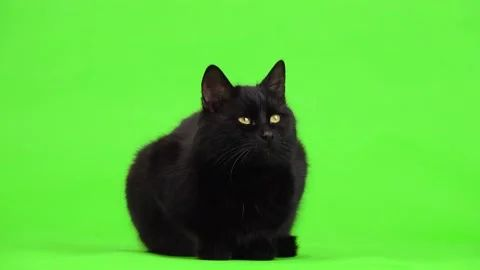

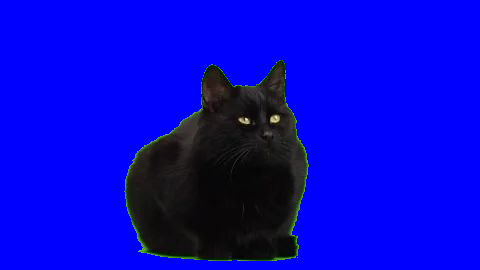

In [ ]:
import cv2
import numpy as np

# Ruta de la imagen
imagen_path = "/content/cat.jpg"
# Lee la imagen
imagen2 = cv2.imread(imagen_path)
imagen = cv2.imread(imagen_path)

# Color original (RGB)
color_original = np.array([107, 243, 71])  # Color que se quiere cambiar
# Nuevo color (RGB)
nuevo_color = np.array([255, 0, 0])  # color que se quiere agregar
# Umbral para determinar la cercanía de los colores (ajustar según sea necesario)
umbral = 90

# Calcula la diferencia entre los colores de la imagen y el color_original
diferencia = np.sqrt(np.sum((imagen.astype(np.float32) - color_original)**2, axis=2))

# Crea una máscara para los píxeles con colores cercanos al color_original
mask = diferencia < umbral

# Cambia el color de los píxeles seleccionados al nuevo_color
imagen[mask] = nuevo_color

# Muestra la imagen original y la imagen con el color cambiado
cv2_imshow(imagen2)
cv2_imshow(imagen)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [ ]:
import cv2
import numpy as np

# Ruta de la imagen
imagen_path = "/content/Cat_November_2010-1a (1).jpg"
# Lee la imagen
imagen2 = cv2.imread(imagen_path)
imagen = cv2.imread(imagen_path)

# Definir diferentes combinaciones de bandas de color como listas de arrays NumPy
color_originals = [
    np.array([179, 190, 208]),  # Color original 1 (RGB) rgb(179, 190, 208)
    np.array([246, 236, 224]),   # Color original 2 (RGB) rgb(246, 236, 224)
    np.array([126, 113, 105])     # Color original 3 (RGB) rgb(64, 51, 32) rgb(126, 113, 105)
]

# Nuevo color (RGB)
nuevo_color = np.array([255, 0, 0])  # Color que se quiere agregar
# Umbral para determinar la cercanía de los colores (ajustar según sea necesario)
umbral = 90

# Iterar sobre cada combinación de color original
for color_original in color_originals:
    # Calcula la diferencia entre los colores de la imagen y el color_original
    diferencia = np.sqrt(np.sum((imagen.astype(np.float32) - color_original)**2, axis=2))

    # Crea una máscara para los píxeles con colores cercanos al color_original
    mask = diferencia < umbral

    # Cambia el color de los píxeles seleccionados al nuevo_color
    imagen[mask] = nuevo_color

    # Muestra la imagen original y la imagen con el color cambiado
    cv2_imshow(imagen2)
    cv2_imshow(imagen)
    cv2.waitKey(0)

cv2.destroyAllWindows()


In [ ]:
!pip install rembg

In [ ]:
from rembg import remove
from PIL import Image
imagenOriginal = "/content/Cat_November_2010-1a.png"
imagenSinFondo = "/content/gatito.png"
input = Image.open(imagenOriginal)
output = remove(input)
output.save(imagenSinFondo)

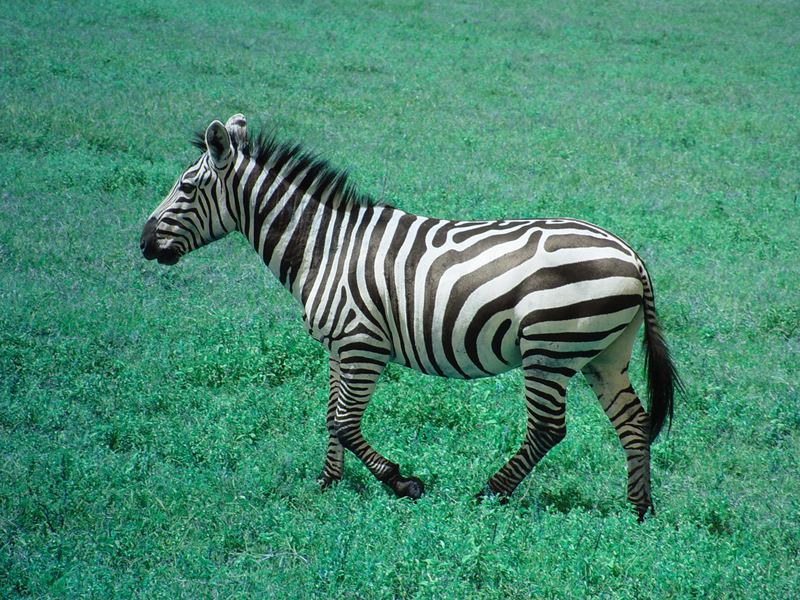

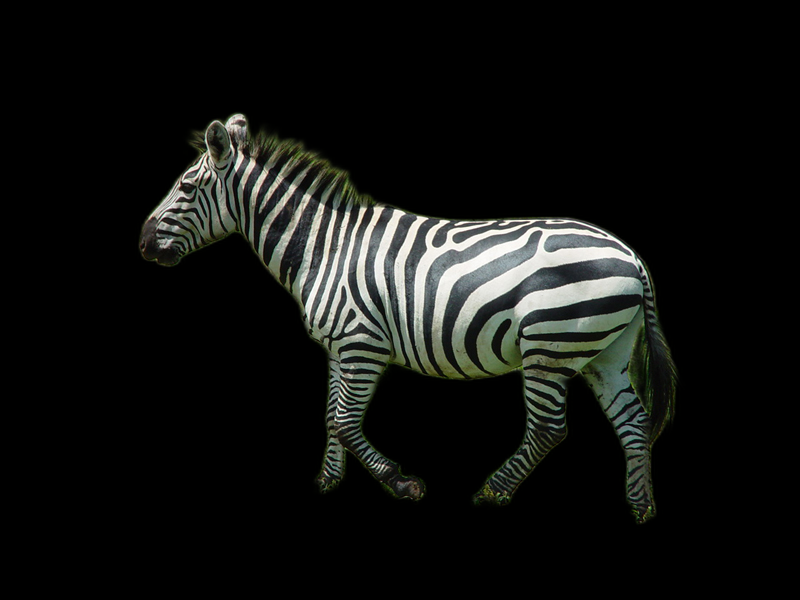

In [ ]:
from rembg import remove
from PIL import Image
import cv2

# Rutas de las imágenes
imagenOriginal = "/content/cebra_2.png"
imagenSinFondo = "/content/cebra.png"

# Cargar la imagen original con OpenCV sin ninguna conversión de espacio de color
input_image = cv2.imread(imagenOriginal)

# Convertir la imagen original a un objeto de imagen de PIL
input_pil = Image.fromarray(input_image)

# Eliminar el fondo de la imagen usando rembg
output_image = remove(input_pil)

# Guardar la imagen sin fondo
output_image.save(imagenSinFondo)

# Mostrar la imagen original y la imagen sin fondo
input_image_rgb = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)
output_image_rgb = cv2.cvtColor(cv2.imread(imagenSinFondo), cv2.COLOR_BGR2RGB)

# Mostrar las imágenes
cv2_imshow(input_image_rgb)
cv2_imshow(output_image_rgb)
cv2.waitKey(0)
cv2.destroyAllWindows()



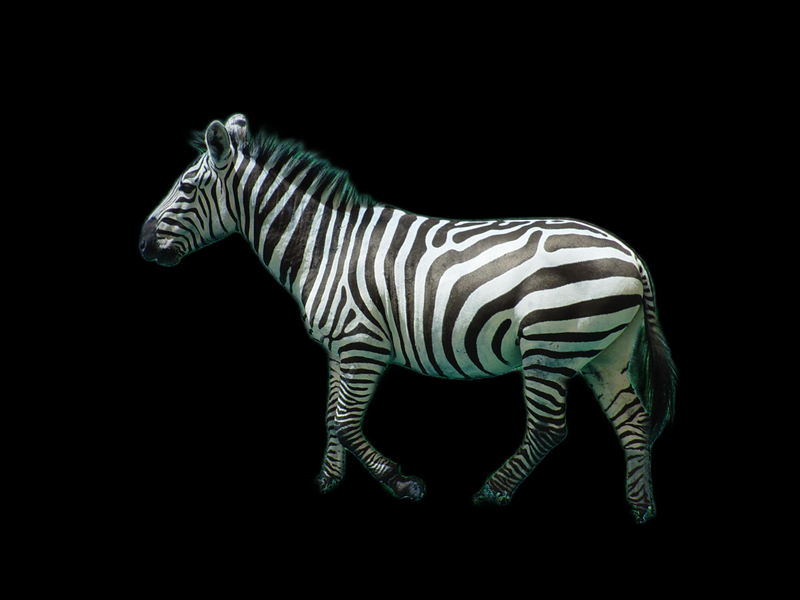

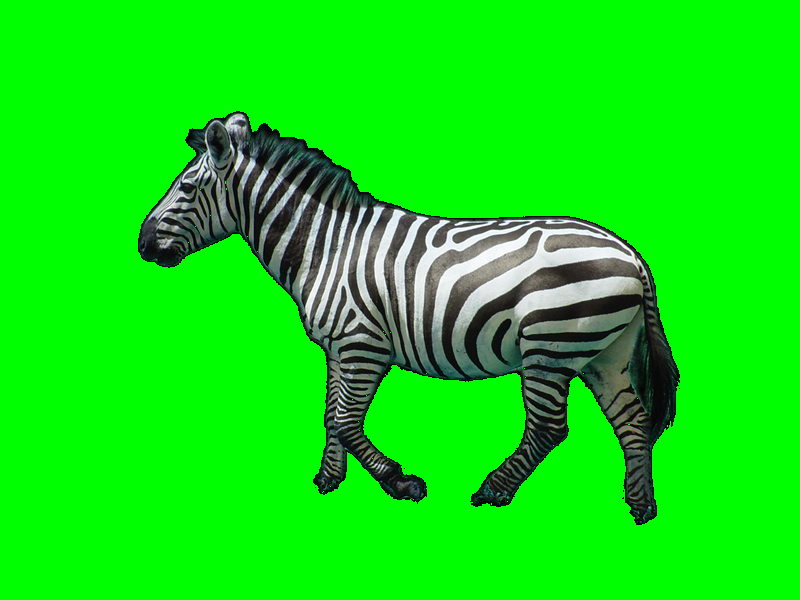

In [ ]:
import cv2
import numpy as np

# Ruta de la imagen
imagen_path = "/content/cebra.png"
# Lee la imagen
imagen2 = cv2.imread(imagen_path)
imagen = cv2.imread(imagen_path)

# Color original (RGB)
color_original = np.array([0, 0, 0])  # Color que se quiere cambiar
# Nuevo color (RGB)
nuevo_color = np.array([0, 255, 0])  # color que se quiere agregar
# Umbral para determinar la cercanía de los colores (ajustar según sea necesario)
umbral = 5

# Calcula la diferencia entre los colores de la imagen y el color_original
diferencia = np.sqrt(np.sum((imagen.astype(np.float32) - color_original)**2, axis=2))

# Crea una máscara para los píxeles con colores cercanos al color_original
mask = diferencia < umbral

# Cambia el color de los píxeles seleccionados al nuevo_color
imagen[mask] = nuevo_color

# Muestra la imagen original y la imagen con el color cambiado
cv2_imshow(imagen2)
cv2_imshow(imagen)

## Punto 2.1

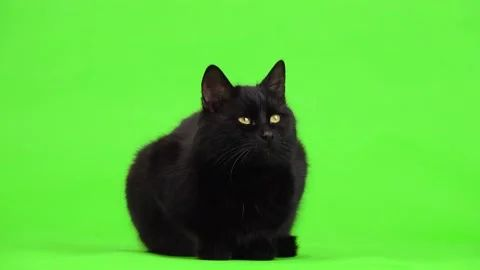

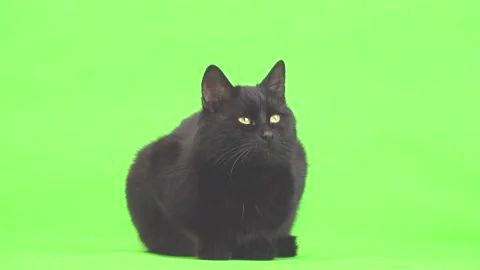

In [ ]:
# Aunmentar brillo
image = cv2.imread('/content/cat.jpg')
Aumento_brillo = 50
Brillo = cv2.add(image, np.ones(image.shape, dtype=np.uint8)*Aumento_brillo)

# Mostrar
cv2_imshow(image)
cv2_imshow(Brillo)
cv2.waitKey(0)
cv2:cv2.destroyAllWindows()

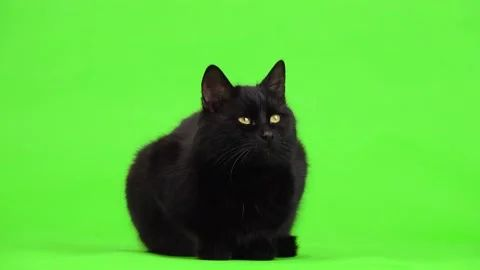

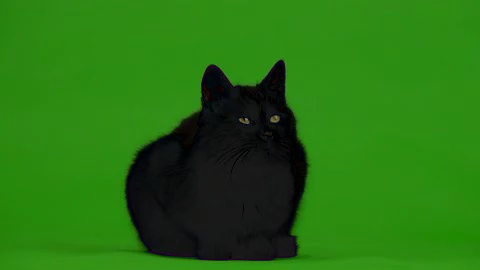

In [ ]:
# Aumentar el brillo
Aplha = 0.7 # Aumentar 1.5
Beta = -30 # Aumentar 30
Brillo1 = cv2.convertScaleAbs(image, alpha=Aplha, beta=Beta)

# Mostrar
cv2_imshow(image)
cv2_imshow(Brillo1)
cv2.waitKey(0)
cv2:cv2.destroyAllWindows()

## PUNTO 2.3

Workflow Untitled run successfully in 1003.330209 ms.


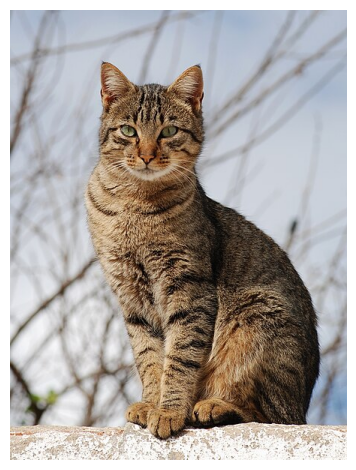

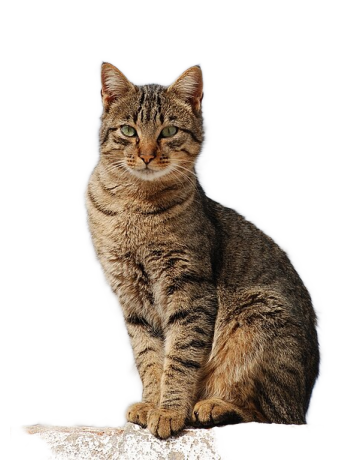

In [ ]:
from ikomia.dataprocess.workflow import Workflow
from ikomia.utils.displayIO import display
import os

# Init your workflow
wf = Workflow()

# Add the MODNet algorithm to the workflow
det = wf.add_task(name="infer_modnet_portrait_matting", auto_connect=True)

# Set process parameters
det.set_parameters({
    "input_size": "600",  # Select a stride of 32
    "cuda": "TRUE"
})

# Load the file from a local path
filename = "/content/Cat_November_2010-1a (1).jpg"  # Replace with the actual file path
wf.run_on(path=filename)

# Inspect your results
display(det.get_input(0))
display(det.get_output(1))


In [ ]:
!pip install detectron2

ERROR: Could not find a version that satisfies the requirement detectron2 (from versions: none)
ERROR: No matching distribution found for detectron2


In [ ]:
pip install ikomia

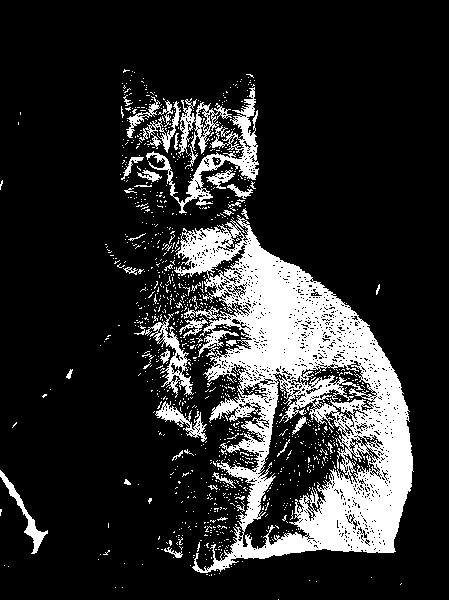

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow


def generate_alpha_mask(image):
    # Convertir la imagen a escala de grises
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Aplicar umbralización para separar el primer plano (foreground) del fondo (background)
    _, binary_mask = cv2.threshold(gray, 80, 255, cv2.THRESH_BINARY)

    # Invertir la máscara binaria para obtener el primer plano
    alpha_mask = cv2.bitwise_not(binary_mask)

    return alpha_mask

# Cargar la imagen
image = cv2.imread("/content/Cat_November_2010-1a (1).jpg")

# Generar la máscara alfa
alpha_mask = generate_alpha_mask(image)

# Guardar la máscara alfa
cv2.imwrite("trimap.jpg", alpha_mask)
cv2_imshow(alpha_mask)

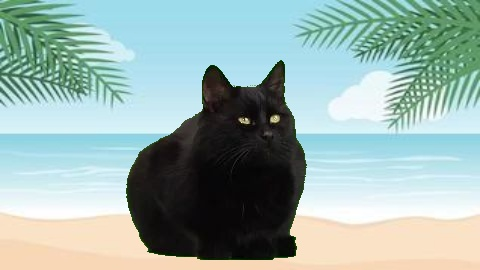

In [ ]:
# Lee la imagen del gato y del nuevo fondo
img_cat = cv2.imread('/content/cat.jpg')
img_background = cv2.imread('/content/playa.jpg')

# Asegúrate de que ambas imágenes tengan las mismas dimensiones
img_background = cv2.resize(img_background, (img_cat.shape[1], img_cat.shape[0]))

# Define el rango de colores de verde en HSV
lower_green = np.array([10, 110, 90])
upper_green = np.array([90, 255, 255])

# Convierte la imagen del gato a HSV
hsv = cv2.cvtColor(img_cat, cv2.COLOR_BGR2HSV)

# Crea una máscara para el color verde
mask = cv2.inRange(hsv, lower_green, upper_green)

# Invierte la máscara
mask_inv = cv2.bitwise_not(mask)

# Aplica la máscara a la imagen del gato
img_cat_fg = cv2.bitwise_and(img_cat, img_cat, mask=mask_inv)

# Aplica la máscara inversa al fondo
img_background_fg = cv2.bitwise_and(img_background, img_background, mask=mask)

# Fusiona el gato con el nuevo fondo
result = cv2.add(img_cat_fg, img_background_fg)

# Guarda el resultado
cv2.imwrite('resultado.jpg', result)

# Muestra el resultado
from IPython.display import Image, display
display(Image('resultado.jpg'))

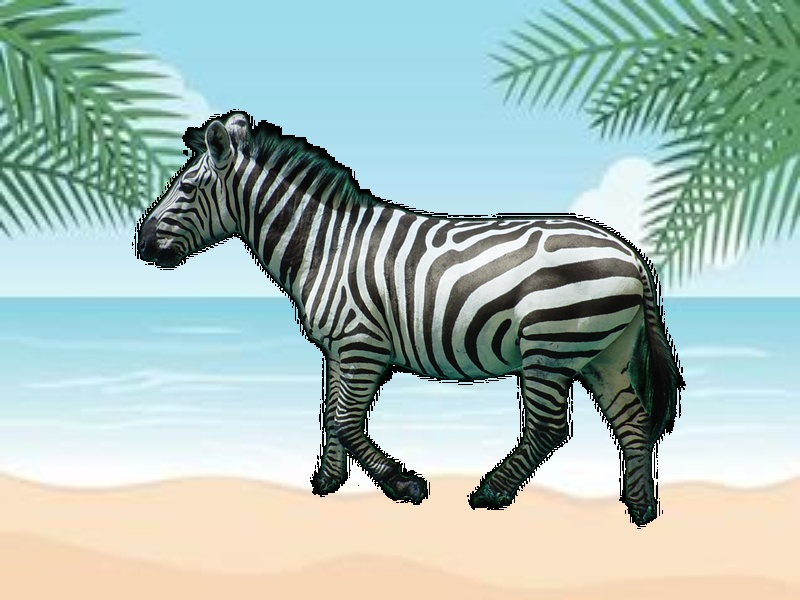

In [ ]:
# Lee la imagen del gato y del nuevo fondo
img_cat = cv2.imread('/content/cebra.png')
img_background = cv2.imread('/content/playa.jpg')

# Asegúrate de que ambas imágenes tengan las mismas dimensiones
img_background = cv2.resize(img_background, (img_cat.shape[1], img_cat.shape[0]))

# Define el rango de colores de verde en HSV
lower_green = np.array([0, 0, 0])
upper_green = np.array([0, 0, 0])

# Convierte la imagen del gato a HSV
hsv = cv2.cvtColor(img_cat, cv2.COLOR_BGR2HSV)

# Crea una máscara para el color verde
mask = cv2.inRange(hsv, lower_green, upper_green)

# Invierte la máscara
mask_inv = cv2.bitwise_not(mask)

# Aplica la máscara a la imagen del gato
img_cat_fg = cv2.bitwise_and(img_cat, img_cat, mask=mask_inv)

# Aplica la máscara inversa al fondo
img_background_fg = cv2.bitwise_and(img_background, img_background, mask=mask)

# Fusiona el gato con el nuevo fondo
result = cv2.add(img_cat_fg, img_background_fg)

# Guarda el resultado
cv2.imwrite('resultado.jpg', result)

# Muestra el resultado
from IPython.display import Image, display
display(Image('resultado.jpg'))

## Punto 3

In [ ]:
# prompt: implementar operador sobel para imagenes en python

# Sobel operador
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

image = cv2.imread('/content/cat.jpg')

# Sobel X
sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
sobelx = np.uint8(np.absolute(sobelx))

# Sobel Y
sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
sobely = np.uint8(np.absolute(sobely))

# Sobel combinada
sobelxy = cv2.Sobel(image, cv2.CV_64F, 1, 1, ksize=3)
sobelxy = np.uint8(np.absolute(sobelxy))

# Mostrar
cv2_imshow(image)
#cv2_imshow(sobelx)
#cv2_imshow(sobely)
cv2_imshow(sobelxy)


error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/deriv.cpp:419: error: (-215:Assertion failed) !_src.empty() in function 'Sobel'


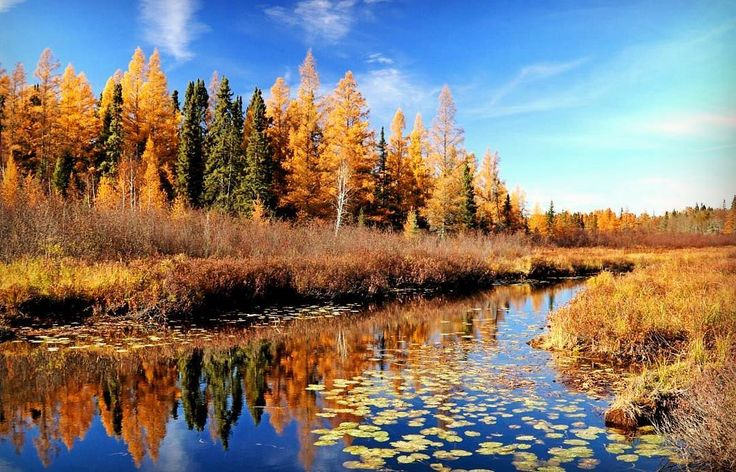

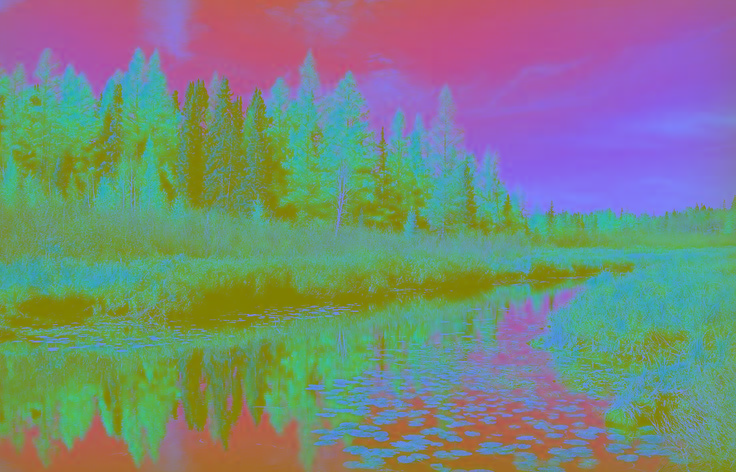

In [ ]:
import cv2

# Definir ajustes preestablecidos de balance de blancos
balance_de_blancos = {
    'tungsteno': cv2.COLOR_BGR2GRAY,
    'fluorescente': cv2.COLOR_BGR2HSV,
    'incandescente': cv2.COLOR_BGR2LAB,
    'luz_solar_directa': cv2.COLOR_BGR2YCrCb
}

# Aplicar ajustes preestablecidos de balance de blancos a una imagen
def aplicar_balance_de_blancos(img, ajuste):
    if ajuste in balance_de_blancos:
        return cv2.cvtColor(img, balance_de_blancos[ajuste])
    else:
        print("Ajuste de balance de blancos no válido.")
        return img

# Ejemplo de uso
img = cv2.imread('/content/Lugares.jpg')
img_con_balance = aplicar_balance_de_blancos(img, 'luz_solar_directa')
cv2.imwrite('imagen_con_balance.jpg', img_con_balance)
cv2_imshow(img)
cv2_imshow(img_con_balance)

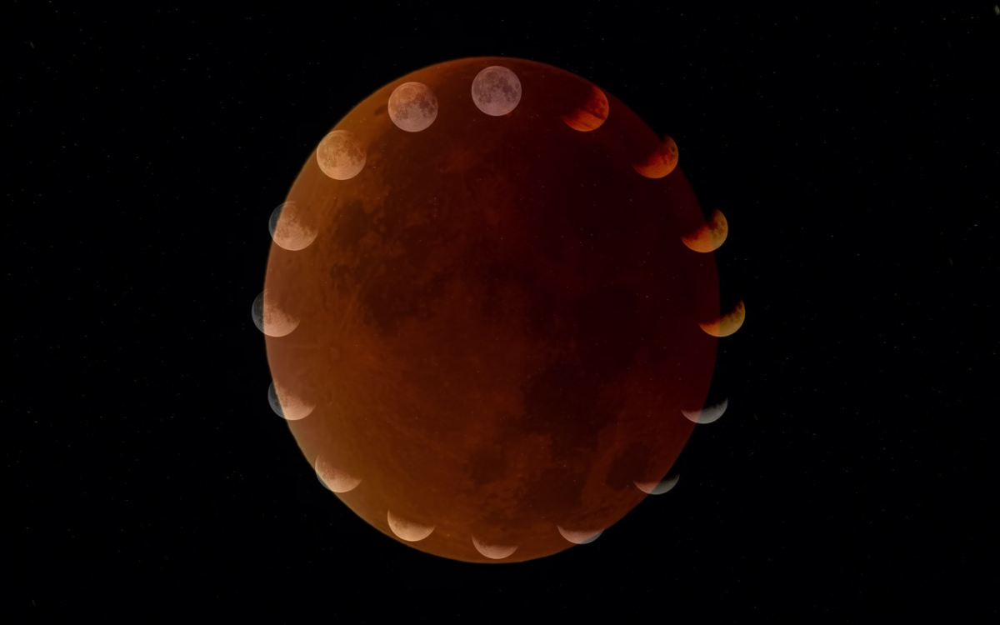

In [ ]:
import cv2

# Cargar las dos imágenes
img1 = cv2.imread('/content/lunas.jpg')
img2 = cv2.imread('/content/LunaR.jpg')

# Redimensionar la segunda imagen para que coincida con las dimensiones de la primera
img2_resized = cv2.resize(img2, (img1.shape[1], img1.shape[0]))

# Ajustar el peso de cada imagen
alpha = 0.5  # Peso para la primera imagen (imagen1)
beta = 0.5   # Peso para la segunda imagen (imagen2_resized)
gamma = 0    # Parámetro de realce (opcional)

# Mezclar las imágenes
blended_img = cv2.addWeighted(img1, alpha, img2_resized, beta, gamma)

# Mostrar la imagen mezclada
cv2_imshow(blended_img)


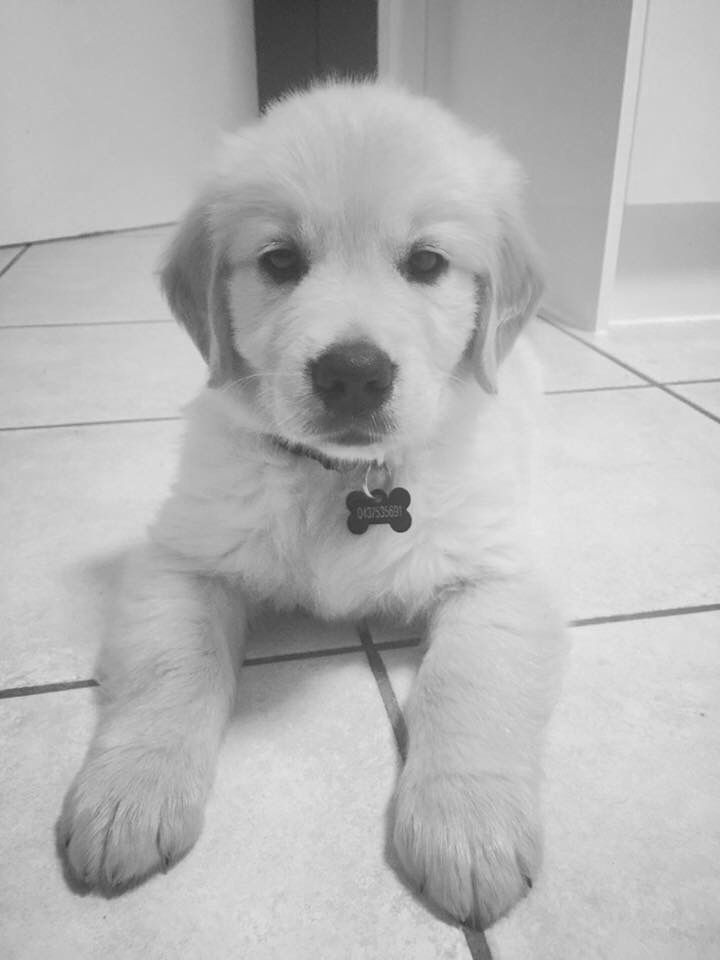

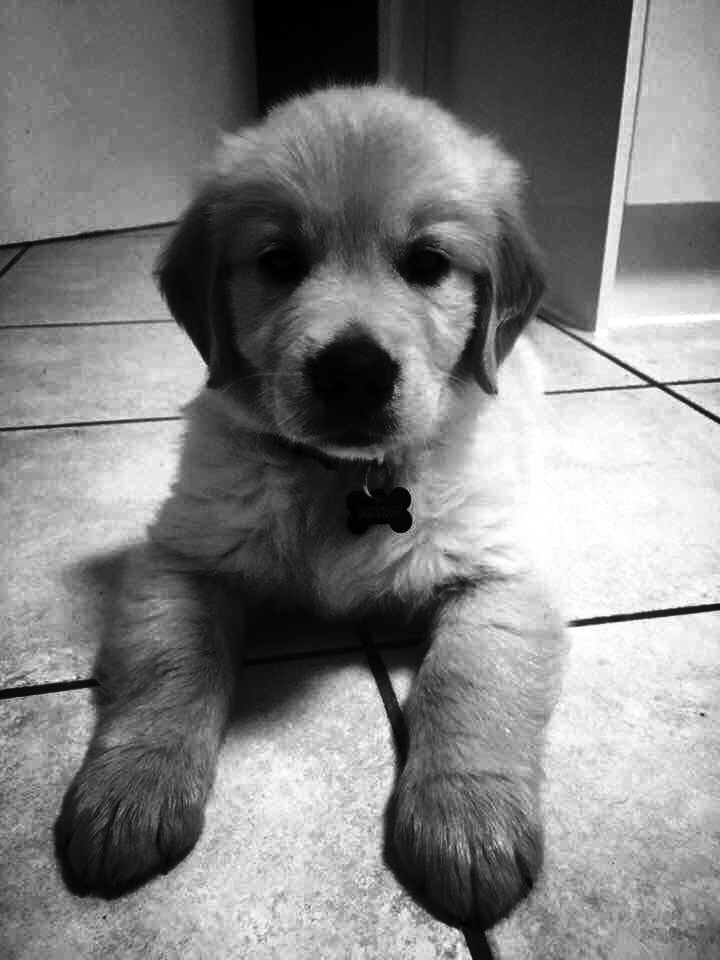

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
# Cargar la imagen
img = cv.imread('/content/Fotos/perro.jpg', cv.IMREAD_GRAYSCALE)

# Verificar si la imagen se cargó correctamente
if img is None:
    print('No se pudo abrir la imagen.')
else:
    # Aplicar ecualización de histograma
    img_equalized = cv.equalizeHist(img)

    # Mostrar la imagen original y la imagen ecualizada
    cv2_imshow(img)
    cv2_imshow(img_equalized)


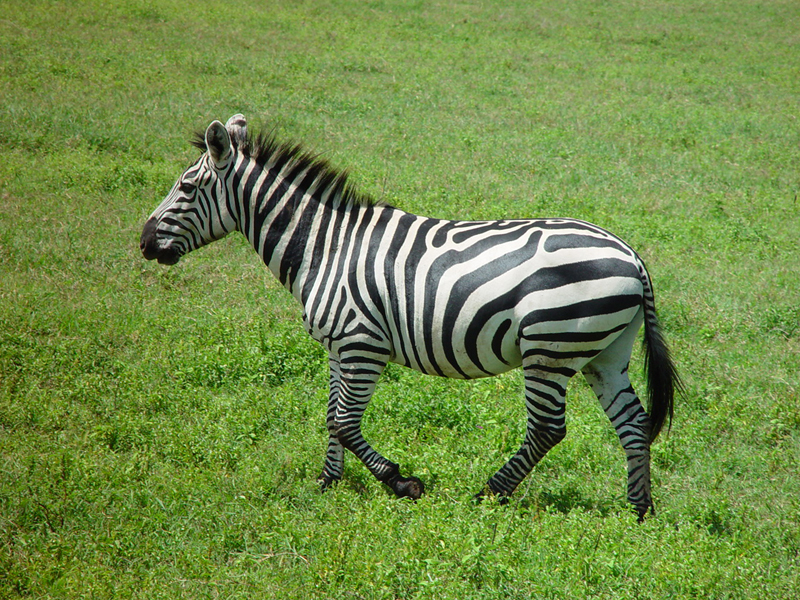

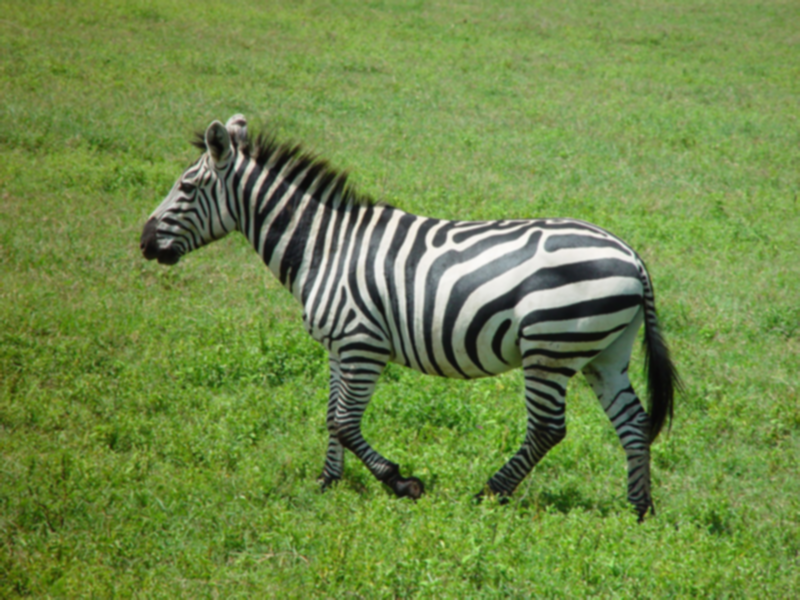

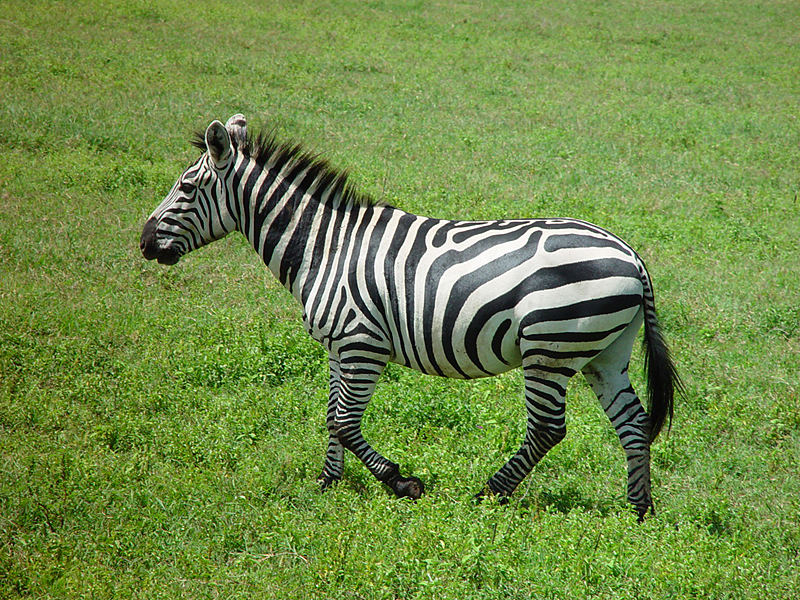

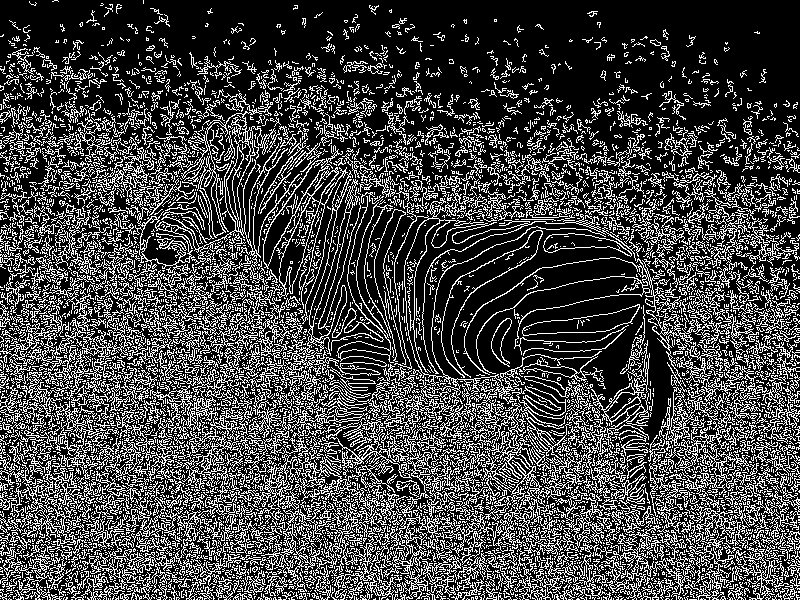

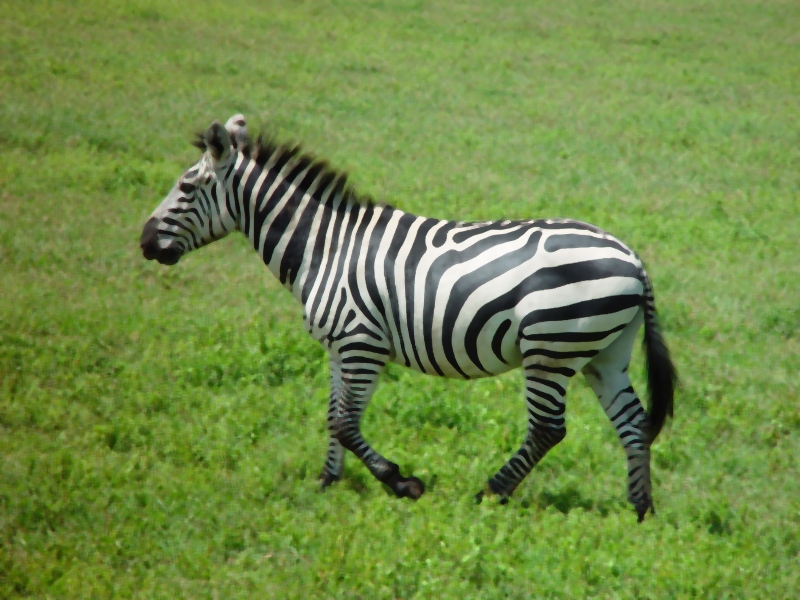

In [ ]:
import cv2 as cv
import numpy as np

# Cargar la imagen
img = cv.imread('/content/cebra_2.png')

# Desenfoque gaussiano
blurred_img = cv.GaussianBlur(img, (5, 5), 0)

# Acentuar la imagen
sharpened_img = cv.addWeighted(img, 1.5, blurred_img, -0.5, 0)

# Convertir la imagen a escala de grises
gray_img = cv.cvtColor(sharpened_img, cv.COLOR_BGR2GRAY)

# Detección de bordes Canny
edges = cv.Canny(gray_img, 100, 200)

# Eliminación de ruido con filtro de mediana
denoised_img = cv.medianBlur(img, 5)

# Mostrar todas las imágenes procesadas
cv2_imshow(img)
cv2_imshow(blurred_img)
cv2_imshow(sharpened_img)
cv2_imshow(edges)
cv2_imshow(denoised_img)


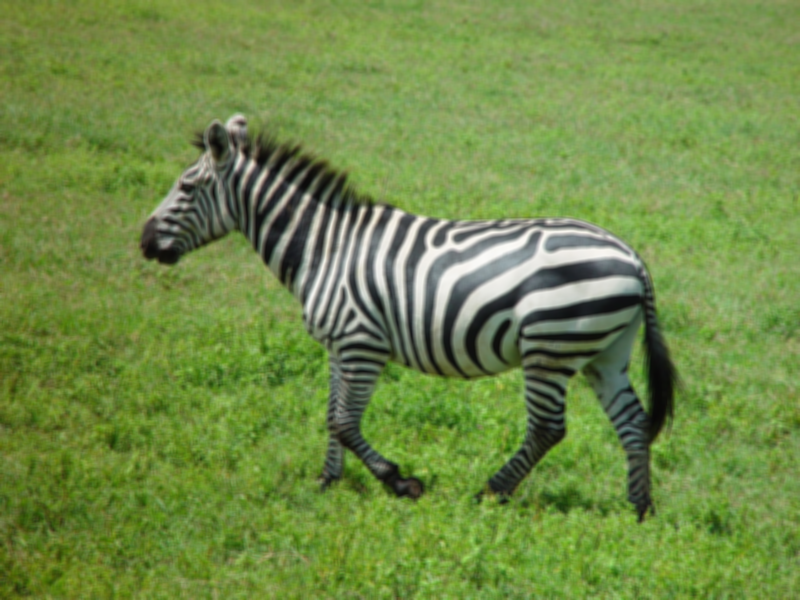

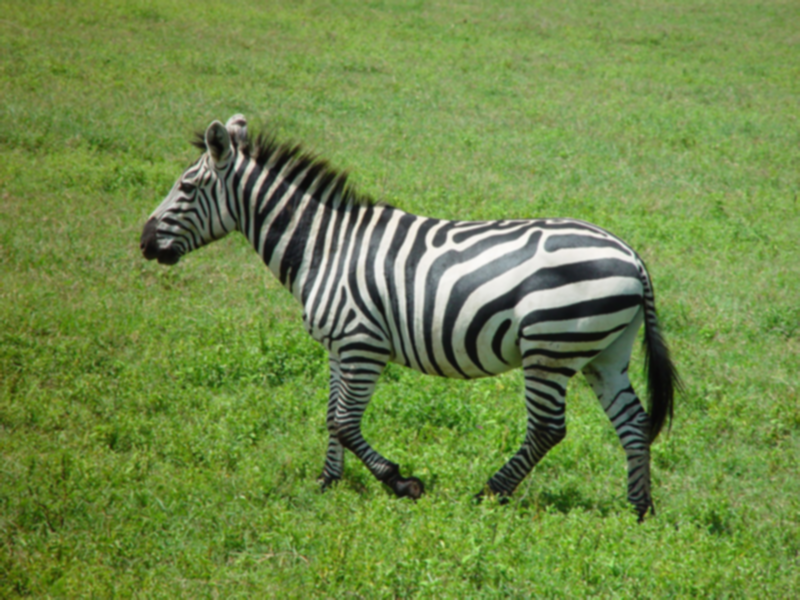

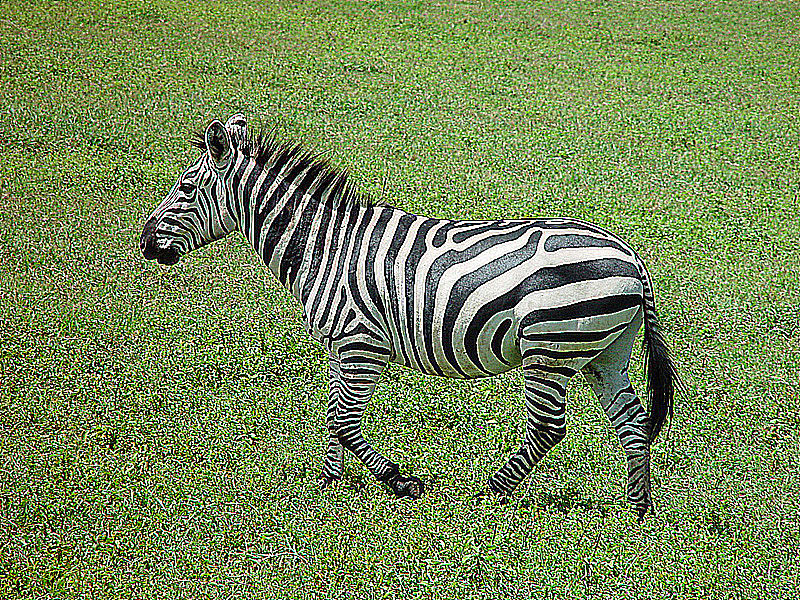

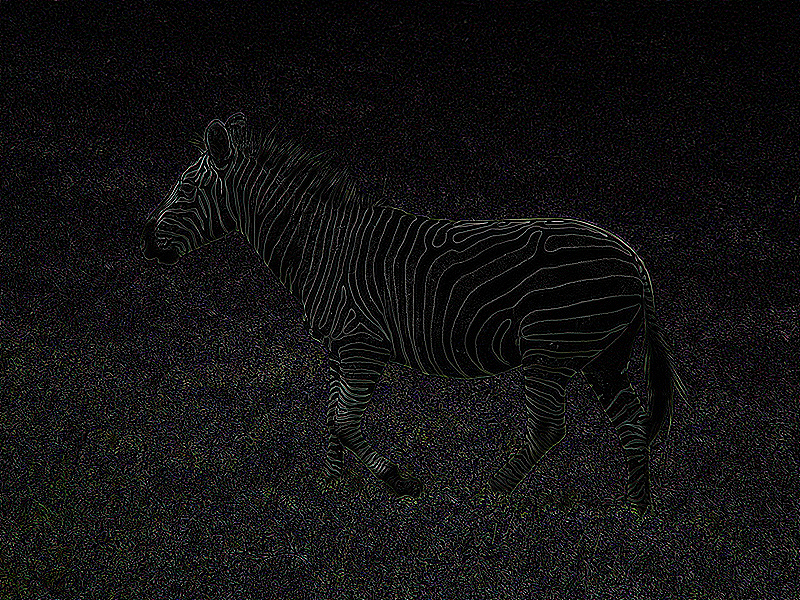

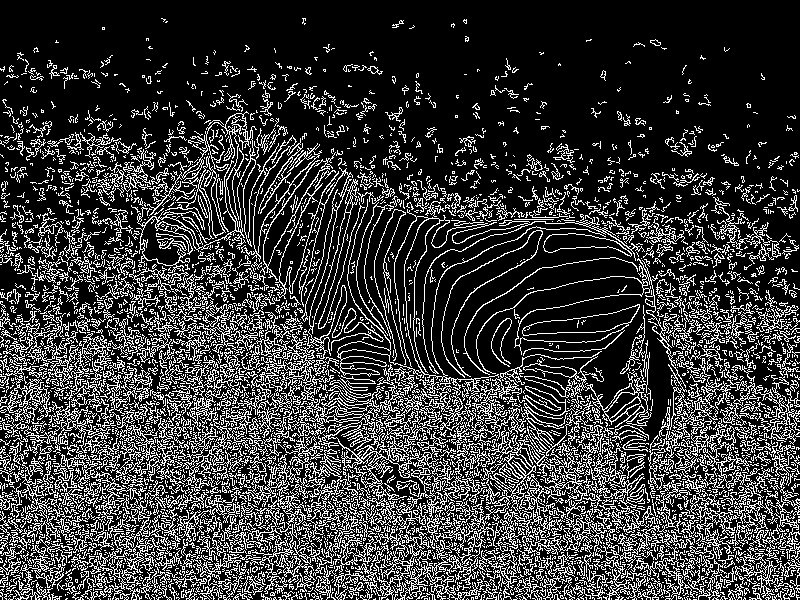

In [ ]:
import cv2 as cv
import numpy as np

# Cargar la imagen
img = cv.imread('/content/cebra_2.png')

# Box Blur
box_blur = cv.blur(img, (5, 5))

# Gaussian Blur
gaussian_blur = cv.GaussianBlur(img, (5, 5), 0)

# Sharpening
kernel_sharpening = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
sharpened_img = cv.filter2D(img, -1, kernel_sharpening)

# Detección de Línea
kernel_line_detection = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
line_detection_img = cv.filter2D(img, -1, kernel_line_detection)

# Detección de Bordes (Canny)
gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
edges = cv.Canny(gray_img, 100, 200)

# Mostrar todas las imágenes procesadas
cv2_imshow(box_blur)
cv2_imshow(gaussian_blur)
cv2_imshow(sharpened_img)
cv2_imshow(line_detection_img)
cv2_imshow(edges)



In [ ]:
import cv2 as cv
import numpy as np

# Cargar la imagen
img = cv.imread('imagen.jpg')

# Definir el tamaño del borde
top = 50
bottom = 50
left = 50
right = 50

# Definir el color del borde constante
border_color = [255, 255, 255]  # Blanco

# Aplicar diferentes efectos de borde
border_zero = cv.copyMakeBorder(img, top, bottom, left, right, cv.BORDER_CONSTANT, value=0)
border_constant = cv.copyMakeBorder(img, top, bottom, left, right, cv.BORDER_CONSTANT, value=border_color)
border_replicate = cv.copyMakeBorder(img, top, bottom, left, right, cv.BORDER_REPLICATE)
border_reflect = cv.copyMakeBorder(img, top, bottom, left, right, cv.BORDER_REFLECT)
border_wrap = cv.copyMakeBorder(img, top, bottom, left, right, cv.BORDER_WRAP)

# Mostrar todas las imágenes con diferentes efectos de borde
cv.imshow('Border Zero', border_zero)
cv.imshow('Border Constant', border_constant)
cv.imshow('Border Replicate', border_replicate)
cv.imshow('Border Reflect', border_reflect)
cv.imshow('Border Wrap', border_wrap)

cv.waitKey(0)
cv.destroyAllWindows()



AttributeError: module 'cv2' has no attribute 'BORDER_CLAMP'